<a href="https://colab.research.google.com/github/shaoyinguo-portfolio/yield-triggers/blob/main/adaptive_yield_triggers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Title: Proactive Yield Loss Drift Detection & Alerting with Adaptive Cadence Configuration

## Background
In high-volume manufacturing, automating **early yield loss drift** detection at different cadences (e.g., shiftly, daily, weekly) is crucial for triggering proper engineering attention for root cause analysis without overloading limited resources.

**Traditional Statistical Process Control (SPC)** methods like P-Charts and Cusum are effective for immediate, lot-level operator intervention. However, they are **poorly suited for engineering analysis** across mixed products with varying baselines, often requiring complex **stratification** and pre-determined trigger limits that miss subtle drifts in stable production with low defect counts.

**EWMA** introduces a smoothing factor ($\lambda$) to allow detection across longer spans, but it's difficult to correlate $\lambda$ with meaningful reporting cadences such as daily or weekly.

**ML methods** like **Isolation Forest** require tuning a fixed contamination parameter, undermining adaptability and risking forced alarms without guaranteeing statistical accuracy.

## Goal
The objective is to establish a **hyperparameter-free statistical framework** that is inherently **adaptive** to mixed-product baselines and seamlessly supports configurable reporting cadences. This approach must provide highly reliable, actionable triggers for engineers to distinguish abnormal yield fluctuations from normal process noise.

## ✅ The Proposed Framework: Adaptive Fisher's Exact Test

Inspired by variable control limits and $\chi^2$, where limits are adaptive to historical averages, this notebook demonstrates **Adaptive Fisher's Exact Test**. This method offers the optimal blend of **statistical rigor and low operational overhead** for engineered reporting:

* **Statistical Foundation**
    * **Benefit:** Provides the most accurate measure of significance via **Exact P-Value**, which is **valid regardless of low defect counts.**
    * **Conclusion:** **Eliminates Approximation Error** inherent in $\chi^2$ and P-Charts.

* **Adaptivity**
    * **Benefit:** Features **Inherent Sample Size Adaptivity** as the test's sensitivity automatically adjusts to the size of the current batch/week being compared to the baseline.
    * **Conclusion:** It is **Hyperparameter-Free**, requiring **minimal tuning** (no $\lambda$ or `contamination` inputs), which simplifies maintenance.

* **Actionability**
    * **Benefit:** Uses **Directional Logic** to combine P-value results with business rules (e.g., only flag increases) to ensure engineers only investigate statistically genuine **detrimental drifts**.
    * **Conclusion:** Represents the **Cleanest Solution**, focusing strictly on actionable, aggregated triggers for efficient investigation.

## Configs

In [153]:
import pandas as pd
import numpy as np
from scipy.stats import fisher_exact, chi2_contingency
from matplotlib import pyplot as plt

N_DAYS = 90
N_PRODUCTS = 2
N_SITES = 2
N_LINKS = 3
N_SHIFTS = 6
N_LOTS = 2000
N_DEFECTMODES = 5
QTY_MEAN = 1000
QTY_STD = 100
LOSS_MEAN = 0
LOSS_STD = 2

P_THRESHOLD = 0.05

REF_GROUP = ['Product']
TRIGGER_GROUP = ['Site', 'Link', 'DaysFromNow', 'WeeksFromNow', 'WeekDay', 'Shift'] # shiftly trigger
# TRIGGER_GROUP = ['Site', 'Link', 'DaysFromNow', 'WeeksFromNow', 'WeekDay'] # daily trigger
# TRIGGER_GROUP = ['Site', 'Link', 'DaysFromNow', 'WeeksFromNow'] # weekly trigger

##Simulated Data Generation

A **storage-efficient ETL/ELT strategy** for this yield loss archiving involves using a **Wide Data Model**.

In this model, **Lot-Level Archiving** is performed: every unique production lot is represented by a single row in the master table, with the loss count for each distinct defect mode stored in a separate column.

The code in this section generates synthetic data in this **Wide Format**.

---

### Trade-off Consideration: Long Format

An alternative is the **Long (or Tidy) Data Model**, where defect modes are **unpivoted** (stacked) into rows.

This Long Format is **schema-flexible** (easily accommodating new defect modes without adding columns) and **directly usable for statistical analysis** (e.g., grouping by defect mode). However, it incurs a **higher storage cost** due to the redundant repetition of identifying metadata (Lot ID, timestamp, etc.) across multiple rows for the same lot.

In [154]:
np.random.seed(42)

df = pd.DataFrame(np.random.rand(N_LOTS,5), columns=['DaysFromNow', 'Product', 'Site', 'Link', 'Shift']) * np.array([N_DAYS, N_PRODUCTS, N_SITES, N_LINKS, N_SHIFTS])
df = df.astype(int).sort_values(['DaysFromNow','Shift'], ascending=[False, True])
df['WeeksFromNow'] = df['DaysFromNow'] // 7
df['WeekDay'] = df['DaysFromNow'] % 7

DEFECT_COLUMNS = [f'Defect_{i}' for i in range(N_DEFECTMODES)]

DATA_COLUMNS = ['Qty'] + DEFECT_COLUMNS

df2 = pd.DataFrame(np.random.randn(N_LOTS,1 + N_DEFECTMODES), columns=DATA_COLUMNS) * np.array([QTY_STD] + [LOSS_STD]*N_DEFECTMODES) + np.array([QTY_MEAN] + [LOSS_STD]*N_DEFECTMODES)
df2 = df2.astype(int).clip(lower=0)

df = pd.concat([df, df2], axis=1)

# can further add product or time specific baseline tweeks here

df.head(10)

,DaysFromNow,Product,Site,Link,Shift,WeeksFromNow,WeekDay,Qty,Defect_0,Defect_1,Defect_2,Defect_3,Defect_4
1540,89,1,1,1,0,12,5,1100,6,0,5,0,2
1724,89,0,1,2,0,12,5,929,2,0,0,0,0
343,89,0,1,2,1,12,5,1065,2,0,0,3,1
835,89,1,1,0,1,12,5,1016,0,5,7,1,2
1073,89,1,0,2,1,12,5,906,4,4,4,2,2
1491,89,1,0,0,1,12,5,971,2,2,3,5,2
1519,89,0,0,2,1,12,5,1023,4,0,2,2,2
78,89,0,0,2,2,12,5,1162,2,1,0,2,0
953,89,1,0,2,2,12,5,815,0,4,2,3,3
1349,89,1,0,2,2,12,5,970,2,4,1,3,3


## Data Transformation

In [155]:
df_week = df[df['WeeksFromNow'] == 0].groupby(REF_GROUP + TRIGGER_GROUP).sum()[DATA_COLUMNS].reset_index()
df_week = df_week.melt(id_vars=df_week.columns[~df_week.columns.isin(DEFECT_COLUMNS)], value_vars=DEFECT_COLUMNS, var_name='DefectName', value_name='DefectQty')
df_week['Loss'] = df_week['DefectQty'] / df_week['Qty']
df_week

,Product,Site,Link,DaysFromNow,WeeksFromNow,WeekDay,Shift,Qty,DefectName,DefectQty,Loss
0,0,0,0,0,0,0,2,914,Defect_0,4,0.004376
1,0,0,0,0,0,0,5,1230,Defect_0,0,0.000000
2,0,0,0,1,0,1,0,1038,Defect_0,3,0.002890
3,0,0,0,4,0,4,1,925,Defect_0,4,0.004324
4,0,0,0,6,0,6,0,949,Defect_0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
670,1,1,2,4,0,4,3,1014,Defect_4,0,0.000000
671,1,1,2,4,0,4,5,868,Defect_4,4,0.004608
672,1,1,2,5,0,5,3,908,Defect_4,0,0.000000
673,1,1,2,5,0,5,5,1028,Defect_4,2,0.001946


In [156]:
df_quarter = df[df['WeeksFromNow'] != 0].groupby(REF_GROUP).sum()[DATA_COLUMNS].reset_index()
df_quarter = df_quarter.melt(id_vars=df_quarter.columns[~df_quarter.columns.isin(DEFECT_COLUMNS)], value_vars=DEFECT_COLUMNS, var_name='DefectName', value_name='DefectQty')
df_quarter['Loss'] = df_quarter['DefectQty'] / df_quarter['Qty']
df_quarter

,Product,Qty,DefectName,DefectQty,Loss
0,0,924462,Defect_0,1639,0.001773
1,1,924581,Defect_0,1536,0.001661
2,0,924462,Defect_1,1616,0.001748
3,1,924581,Defect_1,1666,0.001802
4,0,924462,Defect_2,1683,0.001821
5,1,924581,Defect_2,1682,0.001819
6,0,924462,Defect_3,1582,0.001711
7,1,924581,Defect_3,1618,0.001750
8,0,924462,Defect_4,1654,0.001789
9,1,924581,Defect_4,1599,0.001729


In [157]:
df_process = df_week.merge(df_quarter, on=REF_GROUP + ['DefectName'], how='left', suffixes=('_new', '_ref'))
df_process

,Product,Site,Link,DaysFromNow,WeeksFromNow,WeekDay,Shift,Qty_new,DefectName,DefectQty_new,Loss_new,Qty_ref,DefectQty_ref,Loss_ref
0,0,0,0,0,0,0,2,914,Defect_0,4,0.004376,924462,1639,0.001773
1,0,0,0,0,0,0,5,1230,Defect_0,0,0.000000,924462,1639,0.001773
2,0,0,0,1,0,1,0,1038,Defect_0,3,0.002890,924462,1639,0.001773
3,0,0,0,4,0,4,1,925,Defect_0,4,0.004324,924462,1639,0.001773
4,0,0,0,6,0,6,0,949,Defect_0,0,0.000000,924462,1639,0.001773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
670,1,1,2,4,0,4,3,1014,Defect_4,0,0.000000,924581,1599,0.001729
671,1,1,2,4,0,4,5,868,Defect_4,4,0.004608,924581,1599,0.001729
672,1,1,2,5,0,5,3,908,Defect_4,0,0.000000,924581,1599,0.001729
673,1,1,2,5,0,5,5,1028,Defect_4,2,0.001946,924581,1599,0.001729


##Algorithms

In [158]:
def row_test (row,  suffixes=['_new', '_ref']):
    if row['Loss' + suffixes[0]] <= row['Loss' + suffixes[1]]: # new loss % has to be larger than reference loss %
        return np.nan
    observed_data = np.array([
        [row['Qty' + suffixes[0]], row['DefectQty' + suffixes[0]]],
        [row['Qty' + suffixes[1]], row['DefectQty' + suffixes[1]]]
    ])

    observed_data[:,0] = observed_data[:,0] - observed_data[:,1]
    # chi2, p_value, df, expected_freq = chi2_contingency(observed_data)
    # fisher's exact is the modern standard for 2x2 contingency table because improved computational capabilities as well as highly optimized factorial calculation
    odds_ratio, p_value = fisher_exact(observed_data, alternative='two-sided')
    return float(p_value)

In [159]:
df_process['p_value'] = df_process.apply(row_test, axis=1)
df_process

,Product,Site,Link,DaysFromNow,WeeksFromNow,WeekDay,Shift,Qty_new,DefectName,DefectQty_new,Loss_new,Qty_ref,DefectQty_ref,Loss_ref,p_value
0,0,0,0,0,0,0,2,914,Defect_0,4,0.004376,924462,1639,0.001773,0.081720
1,0,0,0,0,0,0,5,1230,Defect_0,0,0.000000,924462,1639,0.001773,NaN
2,0,0,0,1,0,1,0,1038,Defect_0,3,0.002890,924462,1639,0.001773,0.438621
3,0,0,0,4,0,4,1,925,Defect_0,4,0.004324,924462,1639,0.001773,0.084483
4,0,0,0,6,0,6,0,949,Defect_0,0,0.000000,924462,1639,0.001773,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
670,1,1,2,4,0,4,3,1014,Defect_4,0,0.000000,924581,1599,0.001729,NaN
671,1,1,2,4,0,4,5,868,Defect_4,4,0.004608,924581,1599,0.001729,0.065829
672,1,1,2,5,0,5,3,908,Defect_4,0,0.000000,924581,1599,0.001729,NaN
673,1,1,2,5,0,5,5,1028,Defect_4,2,0.001946,924581,1599,0.001729,0.699480


In [160]:
df_triggers = df_process.dropna(subset=['p_value'])
df_triggers = df_triggers[df_triggers['p_value'] < P_THRESHOLD]
df_triggers

,Product,Site,Link,DaysFromNow,WeeksFromNow,WeekDay,Shift,Qty_new,DefectName,DefectQty_new,Loss_new,Qty_ref,DefectQty_ref,Loss_ref,p_value
6,0,0,1,0,0,0,2,857,Defect_0,6,0.007001,924462,1639,0.001773,0.004728
20,0,0,2,3,0,3,5,917,Defect_0,7,0.007634,924462,1639,0.001773,0.001458
26,0,1,0,0,0,0,0,1062,Defect_0,5,0.004708,924462,1639,0.001773,0.042740
30,0,1,0,3,0,3,3,2912,Defect_0,10,0.003434,924462,1639,0.001773,0.043927
43,0,1,1,5,0,5,5,873,Defect_0,5,0.005727,924462,1639,0.001773,0.020910
46,0,1,1,6,0,6,4,2047,Defect_0,8,0.003908,924462,1639,0.001773,0.032174
68,1,0,1,0,0,0,2,1102,Defect_0,6,0.005445,924581,1536,0.001661,0.011212
96,1,1,0,1,0,1,0,1089,Defect_0,5,0.004591,924581,1536,0.001661,0.037119
99,1,1,0,2,0,2,5,999,Defect_0,5,0.005005,924581,1536,0.001661,0.027142
116,1,1,1,4,0,4,4,948,Defect_0,5,0.005274,924581,1536,0.001661,0.022338


Addtional filters can be added according to business needs:
- Total yield goal (e.g. <99.8%)
- Minimum cumulative loss count (e.g. > 5 losses)

##Visualizations

In [175]:
PLOT_GROUP = ['Product', 'Site', 'Link', 'DefectName']
def plot_trend(row):
    df_plot = df.groupby([i for i in REF_GROUP + TRIGGER_GROUP]).sum().reset_index()
    df_plot = df_plot.melt(id_vars=df_plot.columns[~df_plot.columns.isin(DEFECT_COLUMNS)], value_vars=DEFECT_COLUMNS, var_name='DefectName', value_name='DefectQty')
    # print(' and '.join([f'{key} == "{row[key]}"' if type(row[key]) == str else f'{key} == {row[key]}' for key in PLOT_GROUP]))
    df_plot = df_plot.query(' and '.join([f'{key} == "{row[key]}"' if type(row[key]) == str else f'{key} == {row[key]}' for key in PLOT_GROUP])).copy()
    df_plot['Loss%'] = df_plot['DefectQty'] / df_plot['Qty'] * 100
    df_plot['Day'] = -df_plot['DaysFromNow']
    df_plot = df_plot.sort_values('Day')
    fig, ax = plt.subplots(figsize=(20,5))
    for shift in sorted(df_plot['Shift'].unique()):
        plt.plot(df_plot[df_plot['Shift'] == shift]['Day'], df_plot[df_plot['Shift'] == shift]['Loss%'], '-' if shift == row['Shift'] else ':', label=shift)
        # df_plot[df_plot['Shift'] == shift].plot.scatter(x='Day', y='Loss%', c='Shift', cmap='jet')
    plt.plot(-row['DaysFromNow'], row['DefectQty_new']/row['Qty_new']*100, 'rx', markersize=20)
    ax.axhline(row['DefectQty_ref']/row['Qty_ref']*100, linestyle='--', label='Avg Loss%')
    plt.xlabel('Days From Now')
    plt.ylabel('Loss %')
    plt.title(' '.join([f'{key}: {row[key]}' for key in PLOT_GROUP]))
    plt.legend()
    plt.grid()
    plt.show()

    # return df_plot

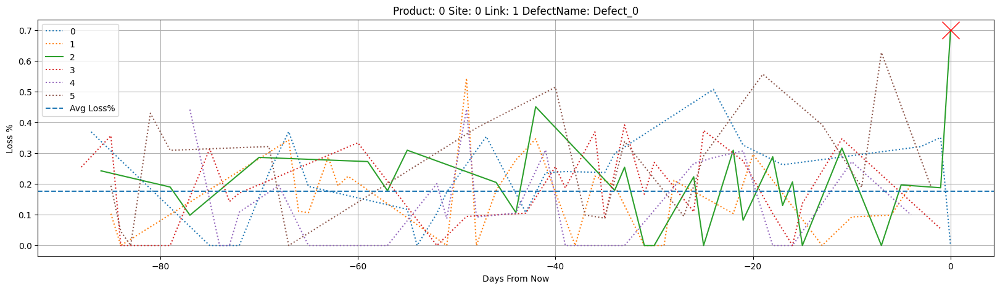

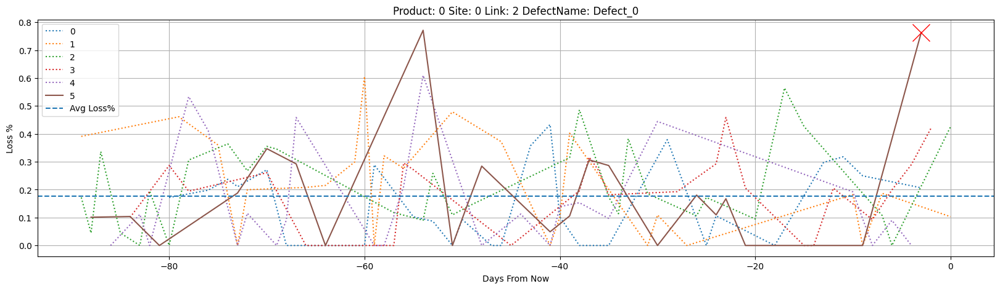

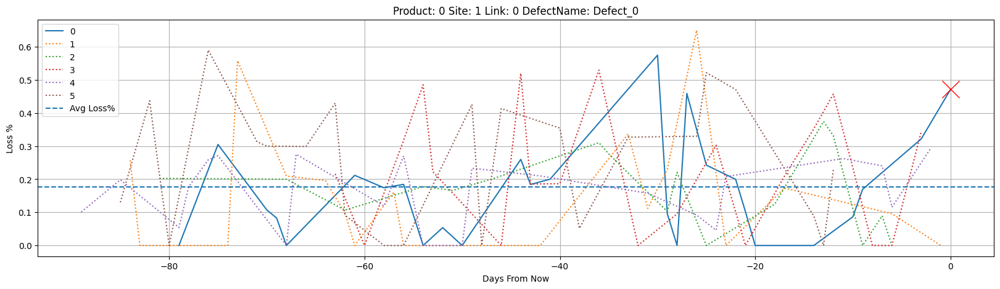

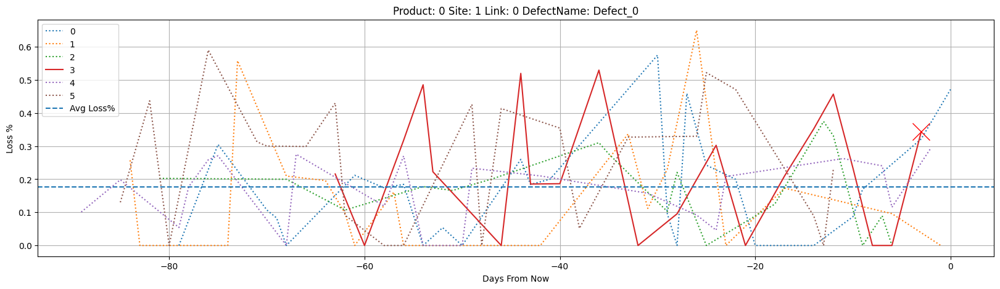

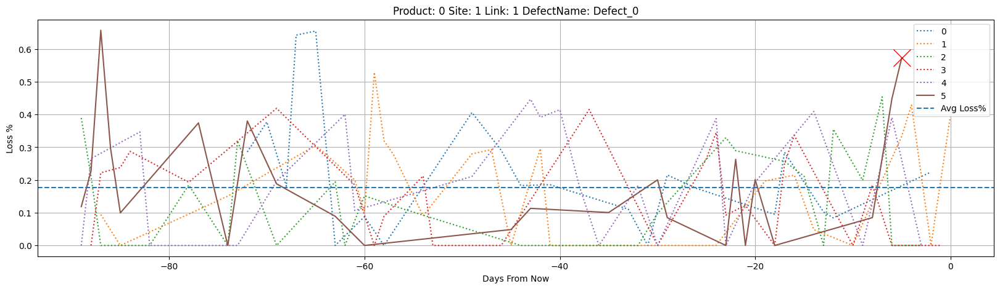

...

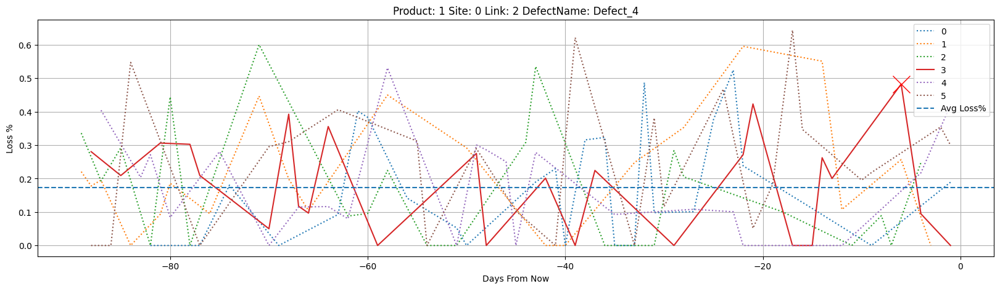

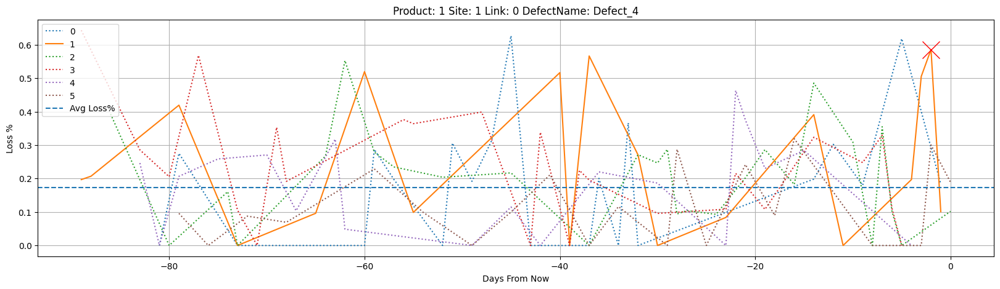

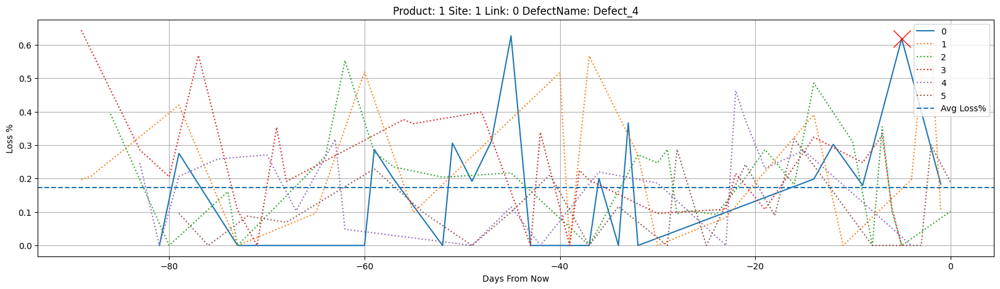

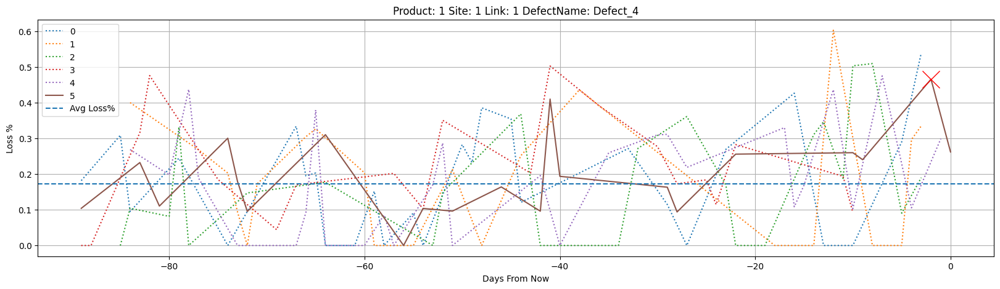

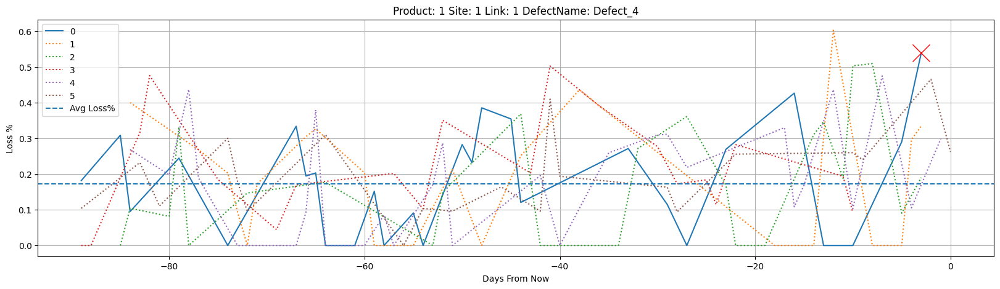

In [176]:
for i in range(len(df_triggers)):
    plot_trend(df_triggers.iloc[i])

# TODO: remove duplicate plots in case multiple triggers in the same group